In [41]:
import tensorflow as tf
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.measure import moments_hu, moments, moments_central, moments_normalized
from sklearn.feature_extraction import image
from sklearn import svm
from skimage.filters import threshold_otsu
from skimage import transform
from skimage.util.shape import view_as_windows
from skimage.morphology import dilation, erosion, opening, closing, square
from scipy.ndimage import morphology
plt.rcParams['figure.figsize'] = [17, 7]
import warnings
import pickle
import gc
import skimage
import time
warnings.filterwarnings('ignore')
from cv2 import imread, resize

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Part3: MLP and CNN
In this part, we will discuss the method of detection using Deep Neural Network. At first, we used the method of sliding window like part2. However, it performed poorly. Therefore, we switch our attention to some state-of-the-art methods. And finally, we use the Mask-RCNN to reach the 1st place in the competitaion, with F1 score 0.734.

The main steps are followed:
- Deal with the data
- Set up and config the model
- Train the model
- Test and analyze

The environment requirement:
- GPU Tesla K80 with 15 G memory
- Memory 12G
- 200G harddisk

### Load data

In [0]:
# load annotations and images
root = "/content/drive/My Drive/Colab Notebooks"

TRAIN_PATH = root + '/project-data/images/train'
TEST_PATH = root + '/project-data/images/test'
VALID_PATH = root + '/project-data/images/validation'
COMPETITION_PATH = root + '/project-data/images/competition'

MODEL_DIR = root + '/logs'

In [0]:
project_data = root + '/project-data'
with open(project_data +'/train.txt') as f:
    names_train = [i.strip('\n') for i in f.readlines()]
    
with open(project_data + '/test.txt') as f:
    names_test = [i.strip('\n') for i in f.readlines()]

with open(project_data + '/validation.txt') as f:
    names_validation = [i.strip('\n') for i in f.readlines()]

In [0]:
annotations_train = pickle.load(open(root + '/annotations_train.p', 'rb'))
annotations_test = pickle.load(open(root + '/annotations_test.p', 'rb'))
annotations_validation = pickle.load(open(root + '/annotations_validation.p', 'rb'))

image_train = pickle.load(open(root + '/image_train.p', 'rb'))
image_test = pickle.load(open(root + '/image_test.p', 'rb'))
image_validation = pickle.load(open(root + '/image_validation.p', 'rb'))

# load the competition data
image_filenames = os.listdir(os.path.join(root, COMPETITION_PATH))
image_filepath = [os.path.join(COMPETITION_PATH, fn) for fn in image_filenames]
image_competition = skimage.io.imread_collection(image_filepath)

In [0]:
# build up the dictionary
id_train_img = {}
id_train_anno = {}

for ind in range(len(names_train)//2, len(names_train)):
  id_train_img[names_train[ind]] = image_train[ind]
  id_train_anno[names_train[ind]] = annotations_train[ind]

In [0]:
id_valid_img = {}
id_valid_anno = {}

for ind in range(len(names_test)):
  id_valid_img[names_validation[ind]] = image_validation[ind]
  id_valid_anno[names_validation[ind]] = annotations_validation[ind]

In [0]:
id_test_img = {}
id_test_anno = {}

for ind in range(len(names_test)):
  id_test_img[names_test[ind]] = image_test[ind]
  id_test_anno[names_test[ind]] = annotations_test[ind]

In [0]:
# in order to release the memory
del image_train
del image_test
del image_validation

### Environment Setup
The backbone of the model is resnet101, which is very slow to train on CPU, therefore, we use Tesla K80 provided in Google Colab to train the model.

In [8]:
!git clone --quiet https://github.com/matterport/Mask_RCNN.git

%cd Mask_RCNN

!pip install -q PyDrive
!pip install -r requirements.txt
!python setup.py install

/content/Mask_RCNN
     |████████████████████████████████| 993kB 7.0MB/s 
     |████████████████████████████████| 204kB 6.3MB/s 
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/mrcnn
copying mrcnn/config.py -> build/lib/mrcnn
copying mrcnn/__init__.py -> build/lib/mrcnn
copying mrcnn/parallel_model.py -> build/lib/mrcnn
copying mrcnn/model.py -> build/lib/mrcnn
copying mrcnn/utils.py -> build/lib/mrcnn
copying mrcnn/visualize.py -> build/lib/mrcnn
creating build/bdist.linux-x86_64
creating build/bdist.li

### Model Setup
Here, we seperate the data and model to two classes, which will be easy for us to build up the pipeline.

In [9]:
# load the module from mask-rcnn
from mrcnn.config import Config
import mrcnn.utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
from mrcnn import utils

Using TensorFlow backend.


In [10]:
class VarroaConfig(Config):
    """Configuration for training on the dataset.
    Derives from the base Config class and overrides values specific
    to the dataset.
    """
    # Give the configuration a recognizable name
    NAME = "varroa"

    # Train on 1 GPU and 1 images per GPU. We can put multiple images on each
    # GPU. Batch size is (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + varroa

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 896
    IMAGE_MAX_DIM = 896

    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 64, 128)  # anchor side in pixels

    # Aim to allow ROI sampling to pick 33% positive ROIs.
    TRAIN_ROIS_PER_IMAGE = 800

    # set number of epoch
    STEPS_PER_EPOCH = 200

    # set validation steps 
    VALIDATION_STEPS = 50
    
config = VarroaConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  896
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  896
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [896 896   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

In [0]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [0]:
class VarroaDataset(utils.Dataset):
    
    def load_shapes(self, mode):
        
        # Add classes
        self.add_class("bug", 1, "varroa")
        

        if mode == "train":  
          for n, id_ in enumerate(id_train_img):
            if n < int(len(id_train_img) * 0.9):
              self.add_image("bug", image_id=id_, path=TRAIN_PATH)
              
        if mode == "val":   
          for n, id_ in enumerate(id_train_img):
            if n >= int(len(id_train_img) * 0.9) and len(id_train_img[id_]) > 0:
              self.add_image("bug", image_id=id_, path=VALID_PATH)

          

    def load_image(self, image_id):
        info = self.image_info[image_id]
        info = info.get("id")

        img = id_train_img[info]
#         img = image_train[names_train.index(image_id)]
        img = resize(img, (config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1]))
       
        return img

    def image_reference(self, image_id):
        """Return the shapes data of the image."""
        info = self.image_info[image_id]
        if info["source"] == "bug":
            return info["bug"]
        else:
            super(self.__class__).image_reference(self, image_id)

    def load_mask(self, image_id):
        """Generate instance masks for shapes of the given image ID.
        """
        
        info = self.image_info[image_id]
        info = info.get("id")
        
        img = id_train_img[info]
        annos = id_train_anno[info]
        
        number_of_masks = len(annos)

        mask = np.zeros([config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1], number_of_masks], dtype=np.uint8)
        iterator = 0
        
        H, W = np.shape(img)[:2]
        for an in annos:
            mask_ = np.zeros((H,W))
            
            xmin = an['bbox'][1]
            ymin = an['bbox'][0]
            h = an['bbox'][3]
            w = an['bbox'][2]
            
            mask_[xmin:xmin+h, ymin:ymin+w] = 1
            
            mask_ = resize(mask_, (config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1]))
            mask[:, :, iterator] = mask_
            iterator += 1
            
        # Map class names to class IDs.
        class_ids = np.ones((number_of_masks,), dtype=int)
        
        return mask, class_ids.astype(np.int32)

In [0]:
dataset_train = VarroaDataset()
dataset_train.load_shapes("train")
dataset_train.prepare()

# Validation dataset
dataset_val = VarroaDataset()
dataset_val.load_shapes("val")
dataset_val.prepare()

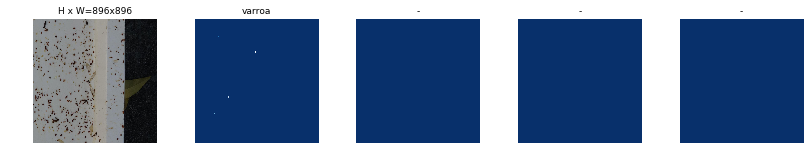

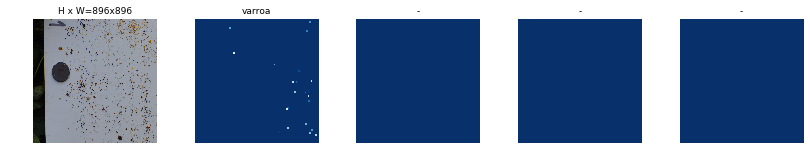

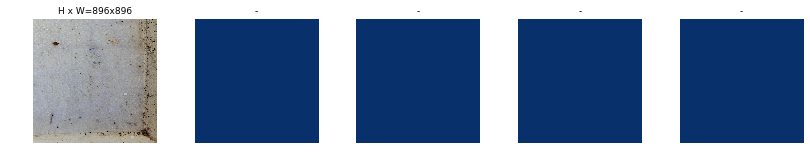

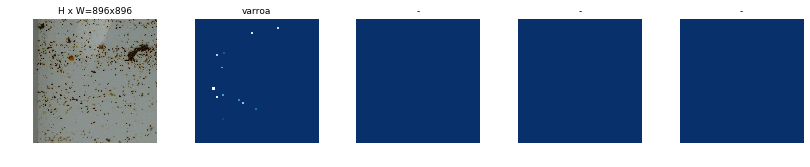

In [42]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

### Train the model

In this part, we will train our model, based on the pre-trained mask-rcnn weights trained from the coco dataset. Please be patient, as even training on a GPU, it will still take 3-4 hours to get a good-performance model. For more detailed information about the model, please refer to https://github.com/matterport/Mask_RCNN

In [15]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

Instructions for updating:
Colocations handled automatically by placer.


In [0]:
# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(root, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [0]:
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last()[1], by_name=True)

In [26]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE, 
            epochs=5, 
            layers='all')


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/drive/My Drive/Colab Notebooks/logs/varroa20190529T2024/mask_rcnn_varroa_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (

In [0]:
# save the model
model_path = os.path.join(MODEL_DIR, "mask_rcnn_epoch5_valid_test.h5")
model.keras_model.save_weights(model_path)

### Test the model
In this part, we will do a brief test and visualize the result on our model. We would like to offer our well-tuned model, which can reach F1 score 0.734 on the competition dataset.

Please download the model here and put it to the corresponding location: https://drive.google.com/open?id=1-s_USIMMwfwQAyhPP20E1dvH9NscgAvF

In [18]:
class InferenceConfig(VarroaConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

Instructions for updating:
Use tf.cast instead.


In [0]:
model_path = os.path.join(MODEL_DIR, "mask_rcnn_epoch15_all_nexthalf.h5")
model.load_weights(model_path, by_name=True)

In [0]:
X_test = np.zeros((len(image_test), config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1], 3), dtype=np.uint8)
sizes_test = []
_test_ids = []

cnt = 0
for id_, img in id_test_img.items():
  _test_ids.append(id_)
  sizes_test.append([img.shape[0], img.shape[1]])
  img = resize(img, (config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1]))
  X_test[cnt] = img
  cnt += 1

==========GroundTruth==========
original_image           shape: (896, 896, 3)         min:    0.00000  max:  221.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max:  896.00000  int64
gt_class_id              shape: (14,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (14, 4)               min:    7.00000  max:  887.00000  int32
gt_mask                  shape: (896, 896, 14)        min:    0.00000  max:    1.00000  uint8


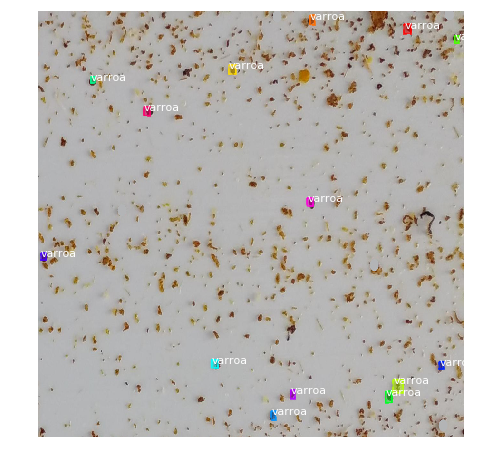

===========Our Result===========
Processing 1 images
image                    shape: (896, 896, 3)         min:    0.00000  max:  221.00000  uint8
molded_images            shape: (1, 896, 896, 3)      min: -115.80000  max:  108.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  896.00000  int64
anchors                  shape: (1, 199920, 4)        min:   -0.10113  max:    1.06537  float32


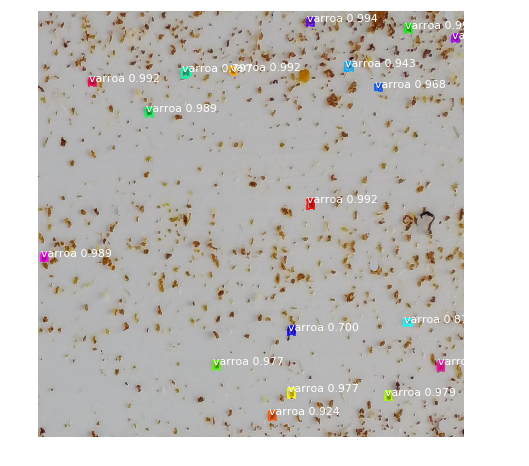

In [53]:
# Test a random image in the validation set
image_id = np.random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset_val, inference_config, image_id, use_mini_mask=False)

print('==========GroundTruth==========')

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names, figsize=(8, 8));

print('===========Our Result===========')

results = model.detect([original_image], verbose=1)

r = results[0]

visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=get_ax());

#### Test using our model
Here, I would like to show a detection result using our model setting IOU score to 0.3. As usual, on the plotting, the black box will show the groundtruth, the blue box will represent the truth positive solution, and the red box will represent the false positive result.

Also, we show Precision, Recall, and F1-score for each image and also the accumulating results for further reference.

In [0]:
# helper function
def plotBlkOnImg(img, blks):
  """
      Plot the predicted result on the image
      img: 3 channel origin image
      blks: array containing left_top, x_h, y_w
  """
  fig, ax = plt.subplots(1,1, figsize=(8,8))

  for blk in blks:
      rect = patches.Rectangle((blk[1], blk[0]), blk[3], blk[2],
              linewidth=1,edgecolor='r',facecolor='none')
#         ax[0].add_patch(rect)
      ax.add_patch(rect)
  ax.imshow(img)
  ax.axis('off')
  plt.show()

def plotAnnoOnImg(img, anno):
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    print(len(anno))
    for an in anno:
        rect = patches.Rectangle((an['bbox'][0], an['bbox'][1]), an['bbox'][2], an['bbox'][3],
                linewidth=1,edgecolor='r',facecolor='none')
#         ax[0].add_patch(rect)
        ax.add_patch(rect)
    ax.imshow(img)
#     ax.axis('off')
    plt.show()

def annoResizeBack(origin_size, annos):
  """
  transform the output of mask-rcnn to block format
  origin_size: origin_h, origin_w
  annos: output of mask-rcnn list of xmin, ymin, xmax, ymax
  """
  
  origin_h, origin_w = origin_size
  resize_h = config.IMAGE_SHAPE[0]
  resize_w = config.IMAGE_SHAPE[1]
  
  h_ratio = origin_h / resize_h
  w_ratio = origin_w / resize_w
  
  blks = []
  
  for an in annos:
    blk = [int(an[0]*h_ratio), int(an[1]*w_ratio), int((an[2]-an[0])*h_ratio), int((an[3]-an[1]) * w_ratio)]
    blks.append(blk)
  
  return blks

def IoUperBlock(img, blocks, gtblock, verbose=0):
    """
        Input:
            img: np.darray
            blocks: list of the prediction ground
            gtblock: groundTruth
        return: IoU value
    """
    
    h, w = np.shape(img)[:2]

    res = []
    resBlock = []
    for block in blocks:
        imgOri = np.zeros((h, w))
        imggt = np.zeros_like(imgOri)
        
        minr = block[0]
        minc = block[1]
        maxr = block[0]+block[2]
        maxc = block[1]+block[3]
        
        imgOri[minr:maxr, minc:maxc] = 1

        imggt[gtblock['bbox'][1]:gtblock['bbox'][1] + gtblock['bbox'][3], gtblock['bbox'][0]:gtblock['bbox'][0] + gtblock['bbox'][2]] = 1

        imgol = imggt + imgOri

        sizeI = np.sum(imgol == 2)
        sizeU = np.sum(imgol == 1) + np.sum(imgol == 2)
        if sizeI > 0:
            if verbose:
                print('IoU is %f' % (sizeI / sizeU))
                plt.imshow(imgol)
                plt.show()
            res.append(sizeI/sizeU)
            resBlock.append(block)
    
    if res:
        return resBlock[np.argmax(res)], np.max(res)
    
    return None, 0.0

In [0]:
TP = 0
ALL_ANNO = 0
ALL_DET = 0

def self_detect_and_plot(img_origin, anno, model, mode=0):
    '''
      This function can calculate the F1-score of our methods and return the
      false positive block for the further reference.
    '''
    global TP, ALL_ANNO, ALL_DET
    
    H, W = np.shape(img_origin)[:2]
    H_resize, W_resize = config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1]

    img_resize = resize(img_origin, (H_resize, W_resize))
    result = model.detect([img_resize], verbose=0)[0]
#     print(result['rois'])
    img_positions = annoResizeBack([H, W], result['rois'])
#     print(img_positions)
    print('The number of detected windows is ', len(img_positions))
  
    if mode:
      img_res = [[blk[1], blk[0], blk[3], blk[2]] for blk in img_positions]
      return img_res
    
    fig, ax = plt.subplots(1,1)

    block_record = []
    fp_blocks = []
    for an in anno:
        block, iou_val = IoUperBlock(img_origin, img_positions, an)
        if iou_val > 0.3:
            rect = patches.Rectangle((block[1], block[0]), block[3], block[2],
                linewidth=0.5,edgecolor='g',facecolor='none')
            ax.add_patch(rect)
            block_record.append(block)
            
    
    for img_block in img_positions:
        if img_block not in block_record:
            rect = patches.Rectangle((img_block[1], img_block[0]), img_block[3], img_block[2],
                    linewidth=0.5,edgecolor='r',facecolor='none')
            ax.add_patch(rect)
            fp_blocks.append(img_origin[img_block[0]:img_block[0]+img_block[2], img_block[1]:img_block[1]+img_block[3], :])
    
    for an in anno:
        rect = patches.Rectangle((an['bbox'][0], an['bbox'][1]), an['bbox'][2], an['bbox'][3],
                linewidth=1,edgecolor='black',facecolor='none')
    #         ax[0].add_patch(rect)
        ax.add_patch(rect)
      
    TP += len(block_record)
    ALL_ANNO += len(anno)
    ALL_DET += len(img_positions)
    
    try:
      P = TP/ALL_DET
      R = TP/ALL_ANNO
      F1 = 2*P*R/(P+R)
      print('P: {} R: {} F1: {}'.format(P, R, F1))
    except:
      print('TP: {} ALL_ANNO: {} ALL_DET: {}'.format(TP, ALL_ANNO, ALL_DET))
    precision = 0.0
    recall = 0.0
    F1 = 0.0
    
    if len(img_positions) > 0:
        precision = len(block_record) / len(img_positions)
    
    if len(anno) > 0:
        recall = len(block_record) / len(anno)
    
    if precision + recall > 0:
        F1 = 2 * (precision * recall) / (precision + recall)
    ax.set_title('Precision: %.4f Recall: %.4f, F1-score: %.4f' % (precision, recall, F1))
    ax.imshow(img_origin)
    plt.show()
    

    return fp_blocks

TEST IMAGE  0
The number of detected windows is  0
TP: 0 ALL_ANNO: 0 ALL_DET: 0


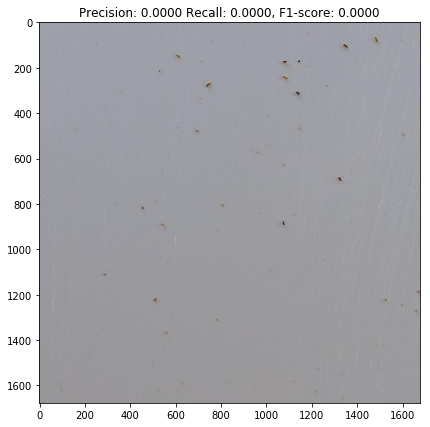

TEST IMAGE  1
The number of detected windows is  1
TP: 0 ALL_ANNO: 0 ALL_DET: 1


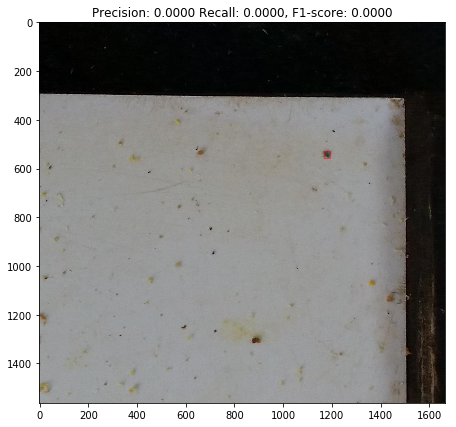

TEST IMAGE  2
The number of detected windows is  22
P: 0.782608695652174 R: 1.0 F1: 0.878048780487805


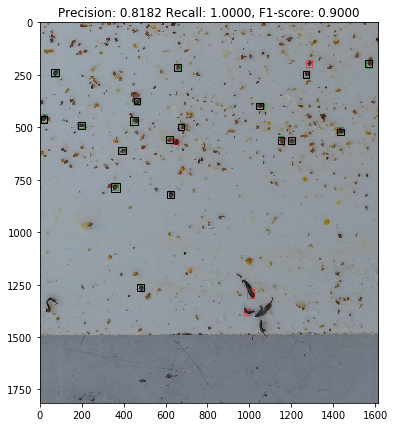

TEST IMAGE  3
The number of detected windows is  1
P: 0.75 R: 1.0 F1: 0.8571428571428571


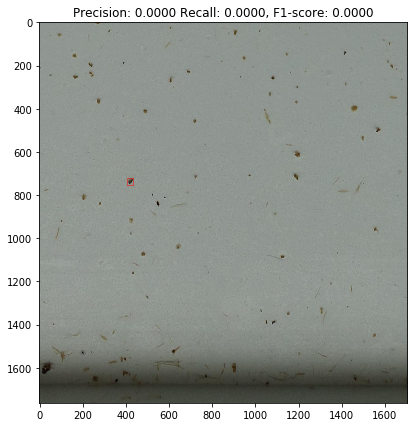

TEST IMAGE  4
The number of detected windows is  20
P: 0.5 R: 0.5789473684210527 F1: 0.5365853658536586


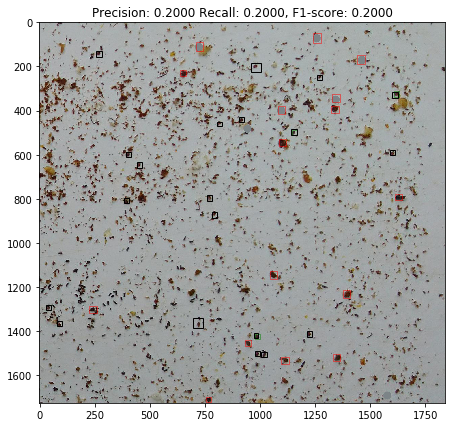

TEST IMAGE  5
The number of detected windows is  10
P: 0.46296296296296297 R: 0.6097560975609756 F1: 0.5263157894736843


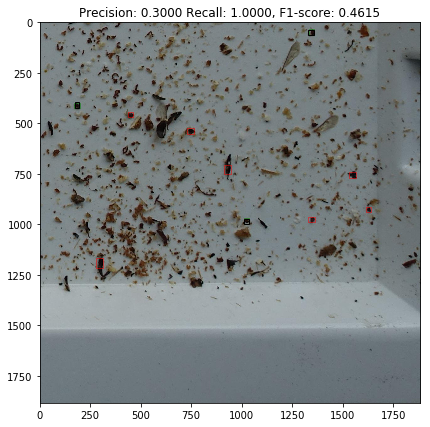

TEST IMAGE  6
The number of detected windows is  1
P: 0.45454545454545453 R: 0.5952380952380952 F1: 0.5154639175257733


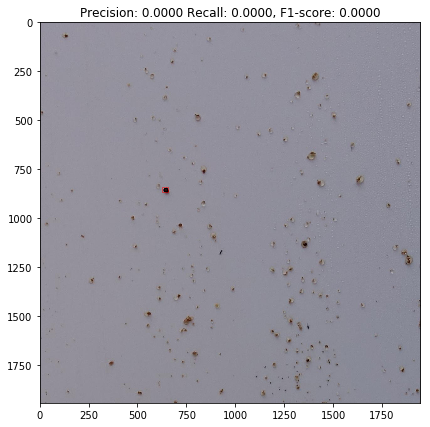

TEST IMAGE  7
The number of detected windows is  33
P: 0.6136363636363636 R: 0.75 F1: 0.6749999999999999


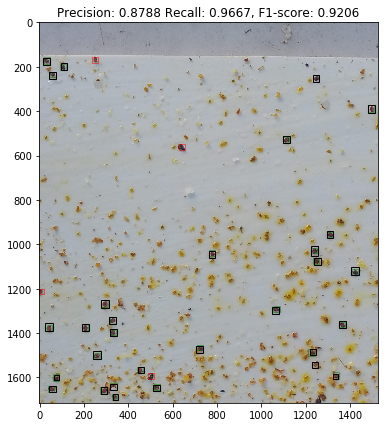

TEST IMAGE  8
The number of detected windows is  3
P: 0.6153846153846154 R: 0.7567567567567568 F1: 0.6787878787878788


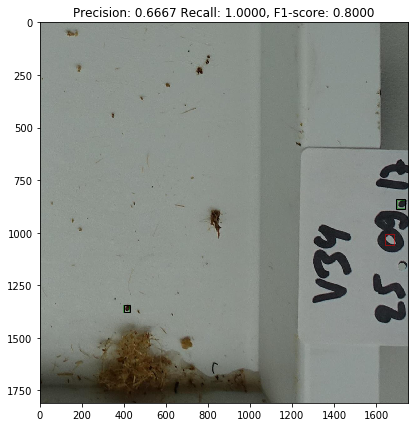

TEST IMAGE  9
The number of detected windows is  0
P: 0.6153846153846154 R: 0.7567567567567568 F1: 0.6787878787878788


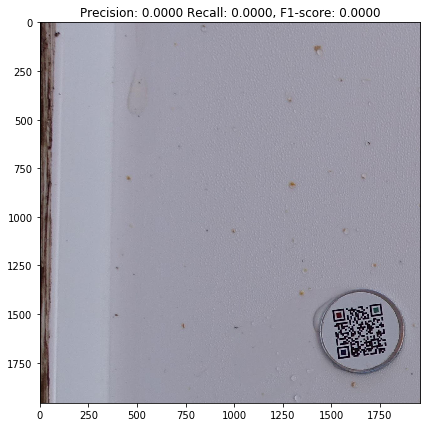

TEST IMAGE  10
The number of detected windows is  1
P: 0.6086956521739131 R: 0.7567567567567568 F1: 0.674698795180723


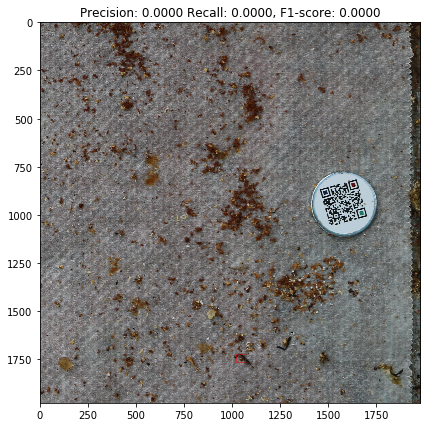

TEST IMAGE  11
The number of detected windows is  30
P: 0.680327868852459 R: 0.7980769230769231 F1: 0.7345132743362832


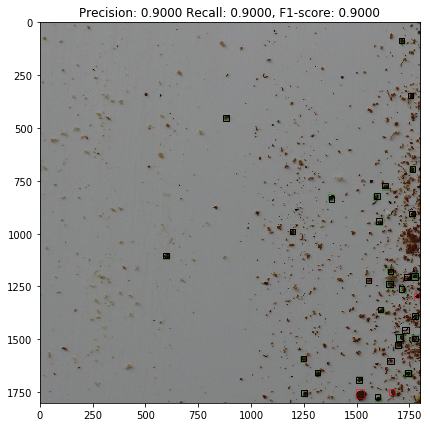

TEST IMAGE  12
The number of detected windows is  1
P: 0.6747967479674797 R: 0.7980769230769231 F1: 0.7312775330396476


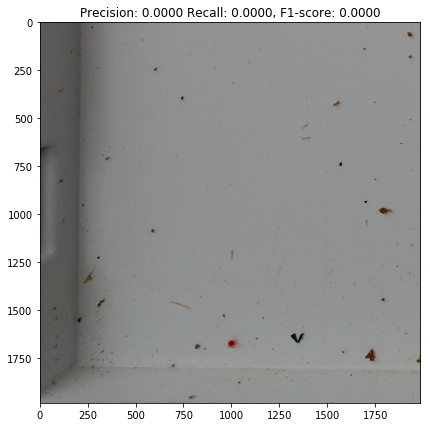

TEST IMAGE  13
The number of detected windows is  0
P: 0.6747967479674797 R: 0.7980769230769231 F1: 0.7312775330396476


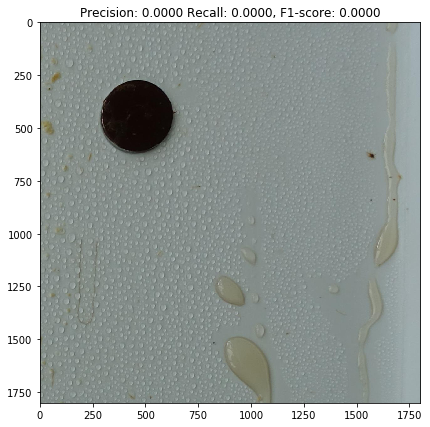

TEST IMAGE  14
The number of detected windows is  4
P: 0.6614173228346457 R: 0.7924528301886793 F1: 0.7210300429184551


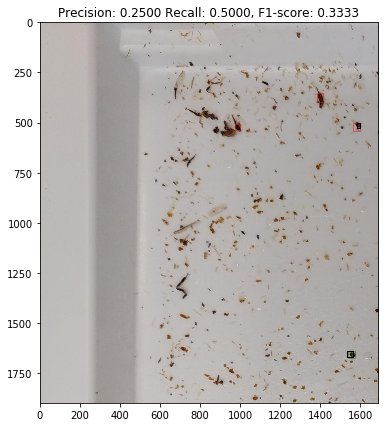

TEST IMAGE  15
The number of detected windows is  8
P: 0.6518518518518519 R: 0.8 F1: 0.7183673469387756


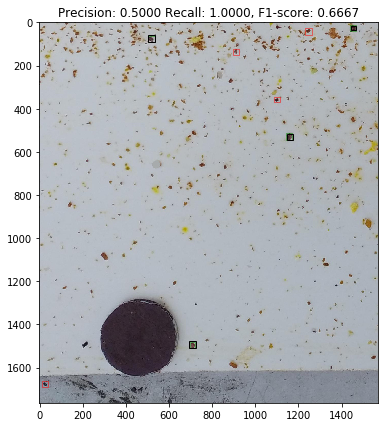

TEST IMAGE  16
The number of detected windows is  0
P: 0.6518518518518519 R: 0.8 F1: 0.7183673469387756


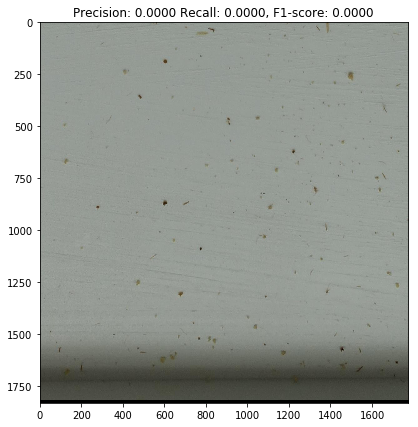

TEST IMAGE  17
The number of detected windows is  7
P: 0.6619718309859155 R: 0.8103448275862069 F1: 0.7286821705426356


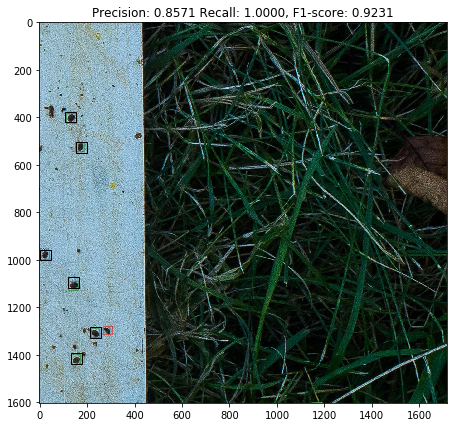

TEST IMAGE  18
The number of detected windows is  9
P: 0.6225165562913907 R: 0.8103448275862069 F1: 0.7041198501872658


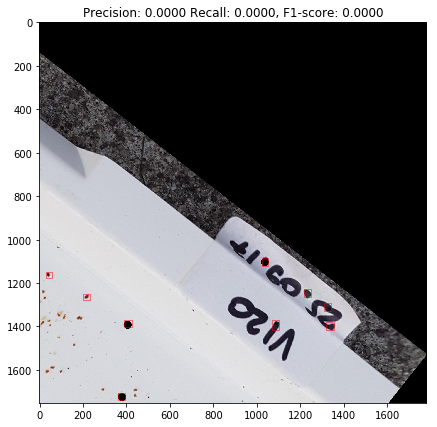

TEST IMAGE  19
The number of detected windows is  0
P: 0.6225165562913907 R: 0.8103448275862069 F1: 0.7041198501872658


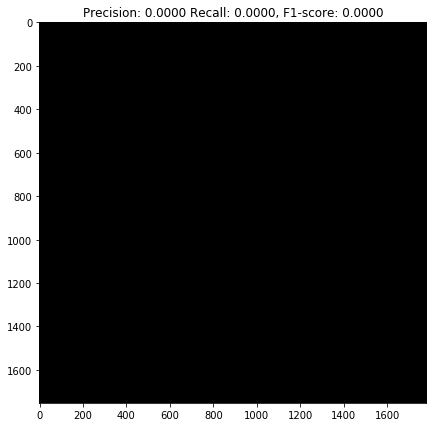

TEST IMAGE  20
The number of detected windows is  19
P: 0.6 R: 0.796875 F1: 0.6845637583892616


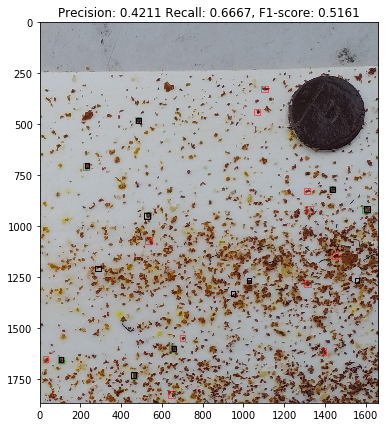

TEST IMAGE  21
The number of detected windows is  2
P: 0.5930232558139535 R: 0.796875 F1: 0.6799999999999999


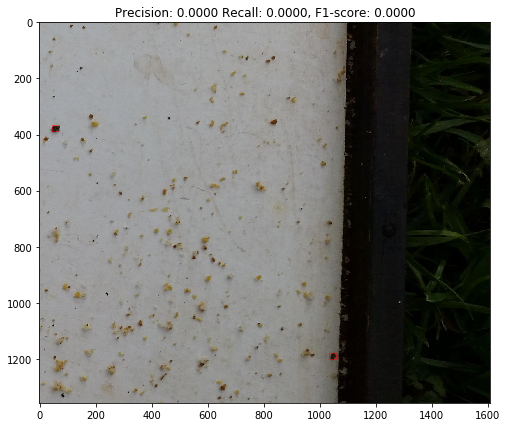

TEST IMAGE  22
The number of detected windows is  100
P: 0.7941176470588235 R: 0.6260869565217392 F1: 0.700162074554295


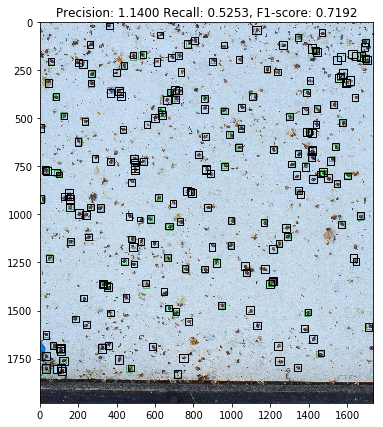

TEST IMAGE  23
The number of detected windows is  29
P: 0.7574750830564784 R: 0.631578947368421 F1: 0.6888217522658611


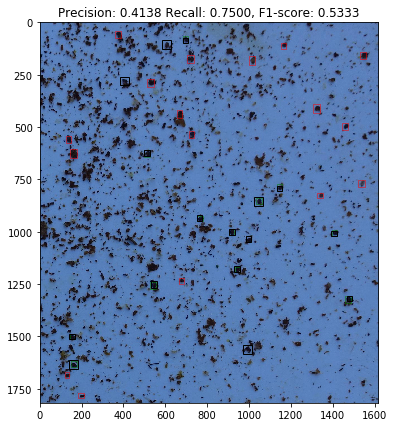

TEST IMAGE  24
The number of detected windows is  1
P: 0.7549668874172185 R: 0.631578947368421 F1: 0.6877828054298641


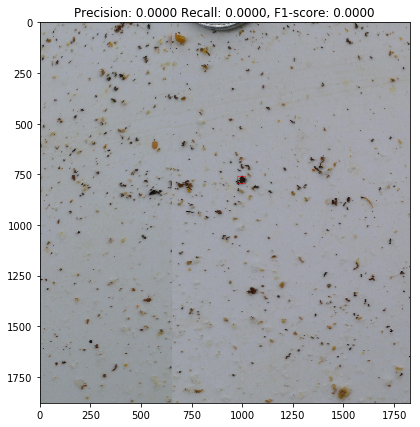

TEST IMAGE  25
The number of detected windows is  38
P: 0.7764705882352941 R: 0.6616541353383458 F1: 0.7144790257104194


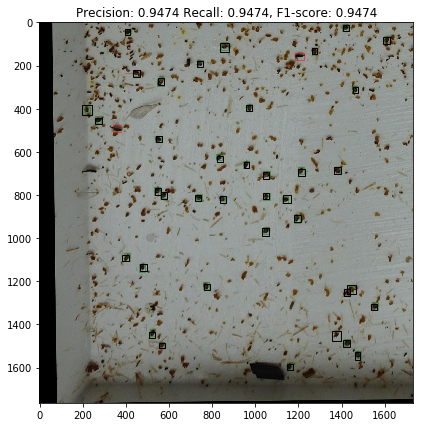

TEST IMAGE  26
The number of detected windows is  5
P: 0.7797101449275362 R: 0.6641975308641975 F1: 0.7173333333333334


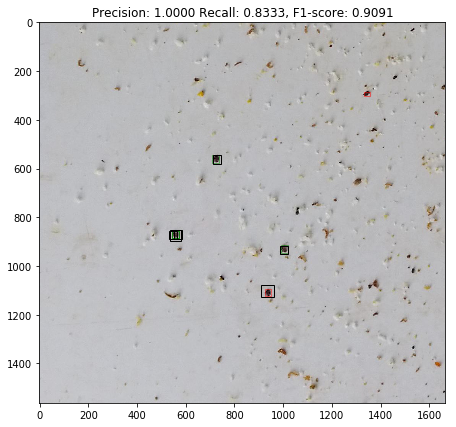

TEST IMAGE  27
The number of detected windows is  11
P: 0.7640449438202247 R: 0.6650366748166259 F1: 0.711111111111111


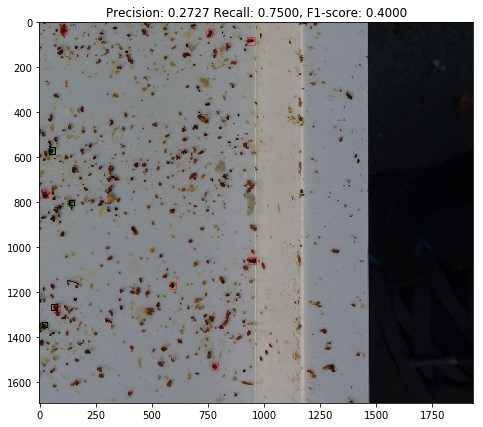

TEST IMAGE  28
The number of detected windows is  1
P: 0.7647058823529411 R: 0.6658536585365854 F1: 0.7118644067796609


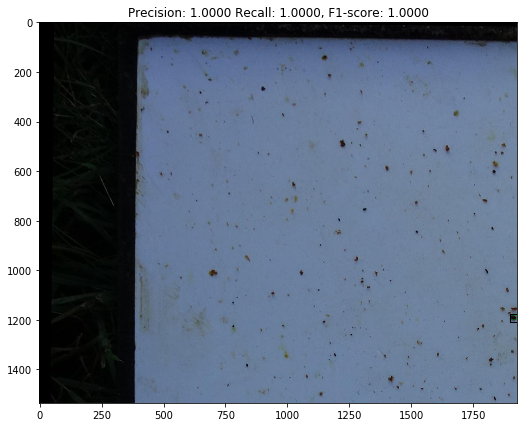

TEST IMAGE  29
The number of detected windows is  4
P: 0.7562326869806094 R: 0.6658536585365854 F1: 0.7081712062256809


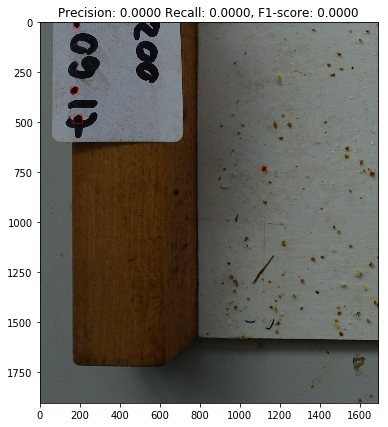

TEST IMAGE  30
The number of detected windows is  3
P: 0.7527472527472527 R: 0.6666666666666666 F1: 0.7070967741935484


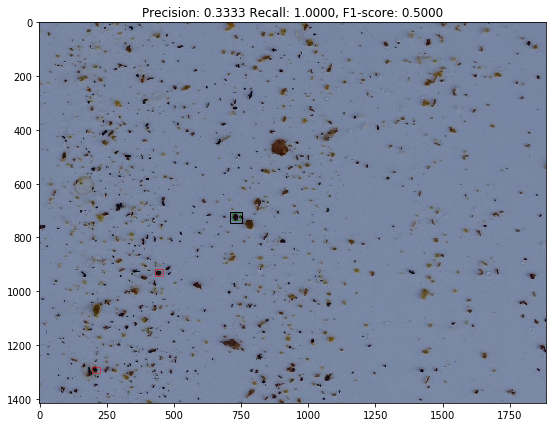

TEST IMAGE  31
The number of detected windows is  5
P: 0.7452574525745257 R: 0.6674757281553398 F1: 0.7042253521126761


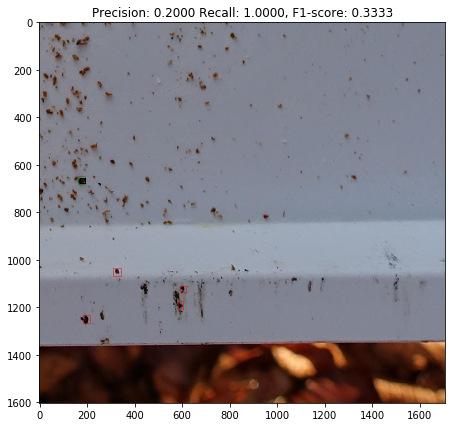

TEST IMAGE  32
The number of detected windows is  7
P: 0.7313829787234043 R: 0.6674757281553398 F1: 0.6979695431472082


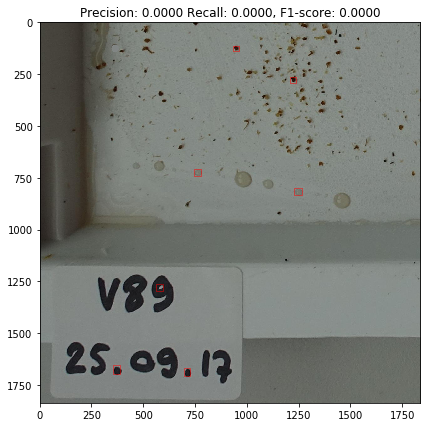

TEST IMAGE  33
The number of detected windows is  18
P: 0.7309644670050761 R: 0.6744730679156908 F1: 0.7015834348355664


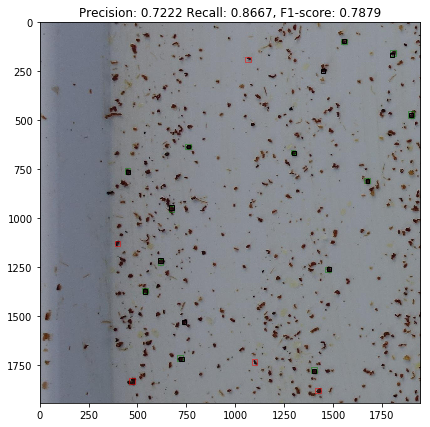

TEST IMAGE  34
The number of detected windows is  12
P: 0.7364532019704434 R: 0.682648401826484 F1: 0.7085308056872038


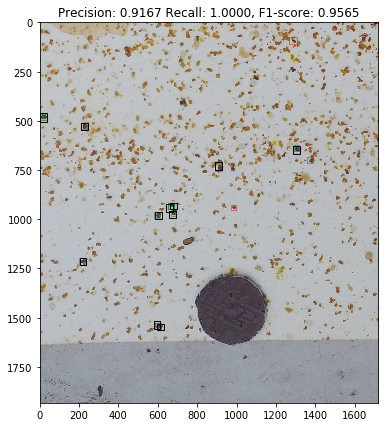

TEST IMAGE  35
The number of detected windows is  6
P: 0.7402912621359223 R: 0.6869369369369369 F1: 0.7126168224299065


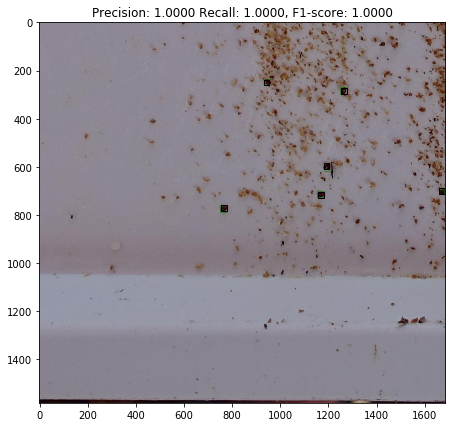

TEST IMAGE  36
The number of detected windows is  0
P: 0.7402912621359223 R: 0.6869369369369369 F1: 0.7126168224299065


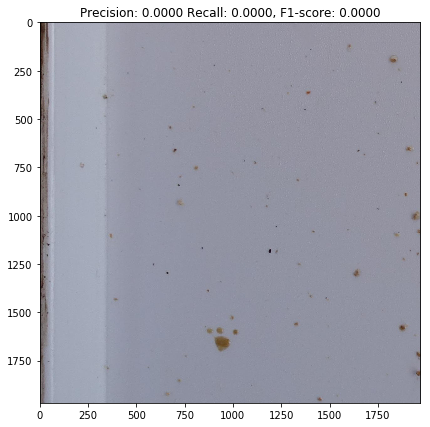

TEST IMAGE  37
The number of detected windows is  8
P: 0.7285714285714285 R: 0.6876404494382022 F1: 0.7075144508670519


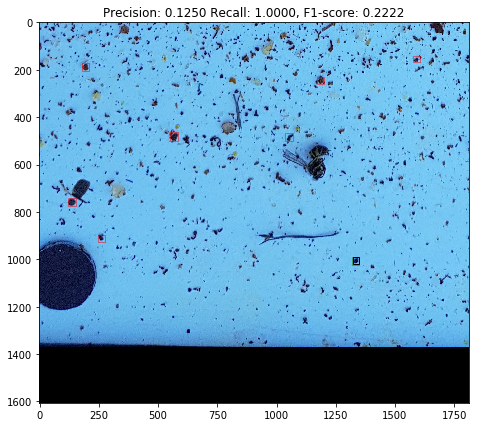

TEST IMAGE  38
The number of detected windows is  2
P: 0.7274881516587678 R: 0.6747252747252748 F1: 0.7001140250855189


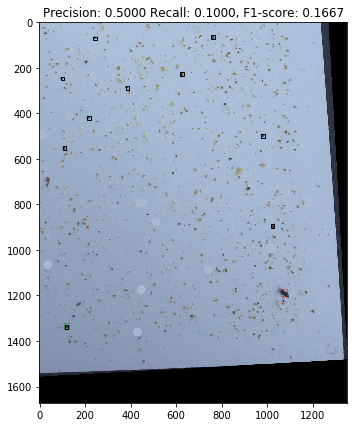

TEST IMAGE  39
The number of detected windows is  21
P: 0.7178329571106095 R: 0.6751592356687898 F1: 0.6958424507658644


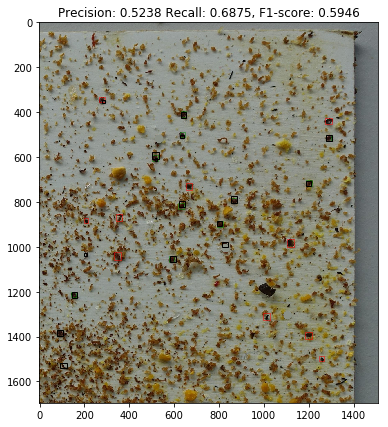

TEST IMAGE  40
The number of detected windows is  25
P: 0.6944444444444444 R: 0.6799163179916318 F1: 0.6871035940803382


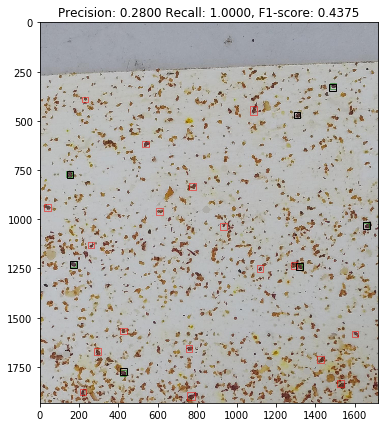

TEST IMAGE  41
The number of detected windows is  2
P: 0.6914893617021277 R: 0.6799163179916318 F1: 0.6856540084388185


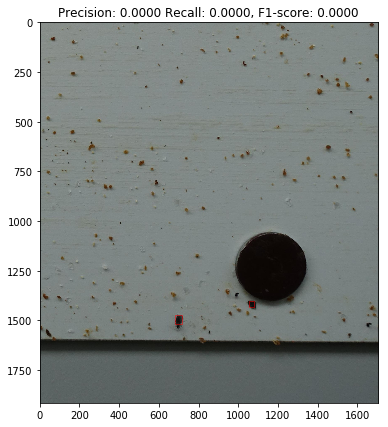

TEST IMAGE  42
The number of detected windows is  2
P: 0.6885593220338984 R: 0.6799163179916318 F1: 0.6842105263157895


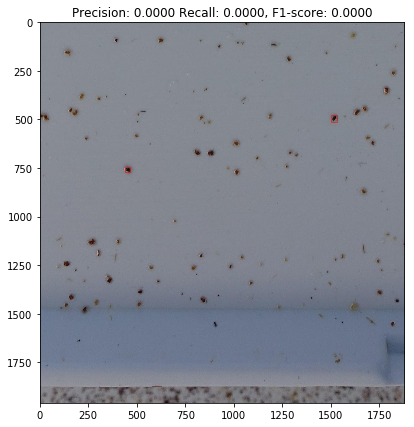

TEST IMAGE  43
The number of detected windows is  9
P: 0.6923076923076923 R: 0.6851851851851852 F1: 0.688728024819028


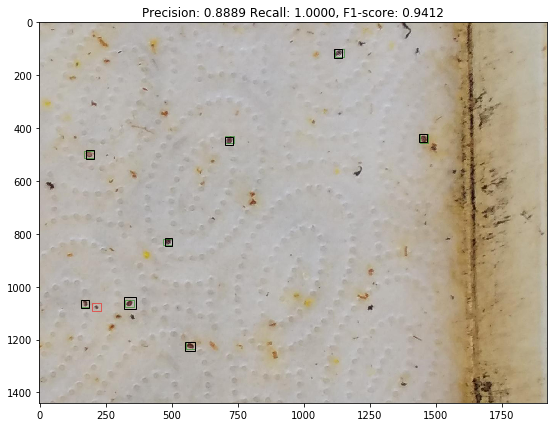

TEST IMAGE  44
The number of detected windows is  15
P: 0.6814516129032258 R: 0.6869918699186992 F1: 0.6842105263157895


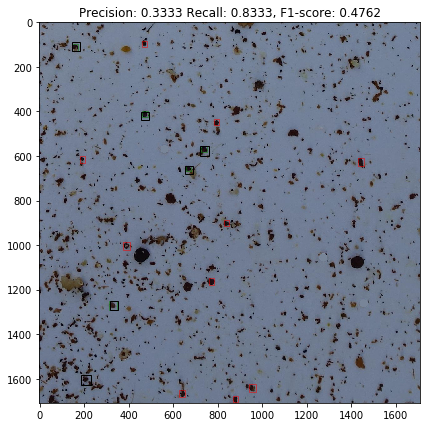

TEST IMAGE  45
The number of detected windows is  1
P: 0.682092555331992 R: 0.6876267748478702 F1: 0.6848484848484849


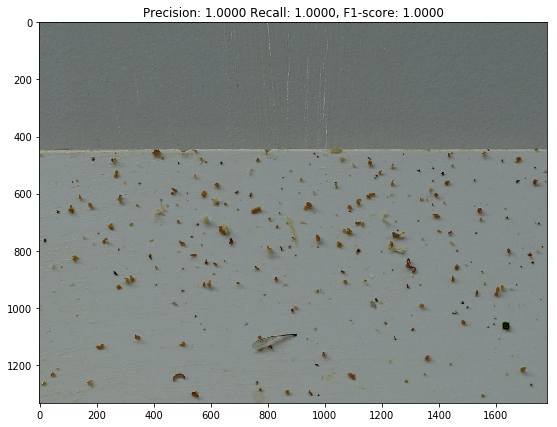

TEST IMAGE  46
The number of detected windows is  2
P: 0.6813627254509018 R: 0.6882591093117408 F1: 0.6847935548841894


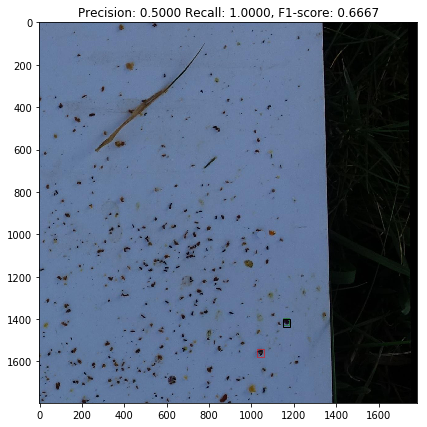

TEST IMAGE  47
The number of detected windows is  13
P: 0.685546875 R: 0.695049504950495 F1: 0.6902654867256637


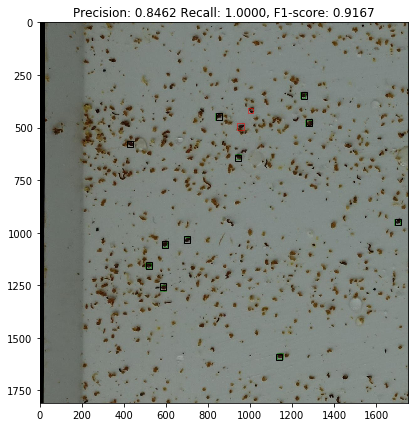

TEST IMAGE  48
The number of detected windows is  59
P: 0.712784588441331 R: 0.7090592334494773 F1: 0.7109170305676855


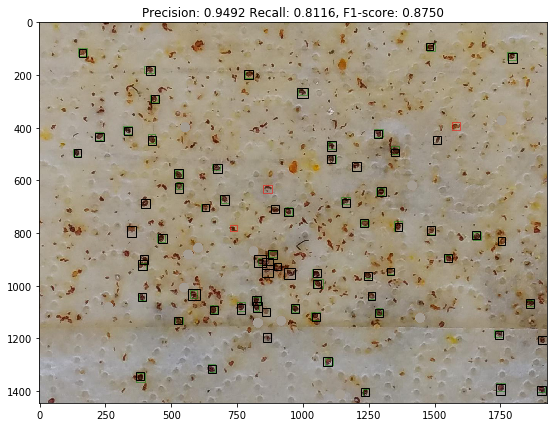

TEST IMAGE  49
The number of detected windows is  8
P: 0.7167530224525043 R: 0.7130584192439863 F1: 0.7149009474590869


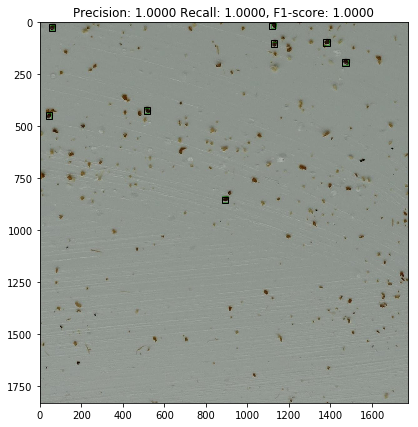

In [63]:
for ind in range(len(image_test)):
  print('TEST IMAGE ', ind)
  self_detect_and_plot(image_test[ind], annotations_test[ind], model);

#### Generate Submission for both test dataset and competition dataset

In [0]:
def detect_by_mrcnn(img_origin, model):
    """
    Detect varroa using the method of Mask-RCNN
    Input: One single image and the model used
    Output: A numpy array containing coordonates of all detected varroas, with the following format: 
            [[x_1, y_1, w_1, h_2], [x_2, y_2, w_1, h_2], ..., [x_n, y_n, w_n, h_n]] 
            where ''n'' is the number of detected varroas.
    """
    H, W = np.shape(img_origin)[:2]
    H_resize, W_resize = config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1]
    
    # resize the image to fit the model
    img_resize = resize(img_origin, (H_resize, W_resize))
    result = model.detect([img_resize], verbose=0)[0]
                    
    # resize back to the normal size
    img_positions = annoResizeBack([H, W], result['rois'])
    print('The number of detected windows is ', len(img_positions))
  
    img_res = [[blk[1], blk[0], blk[3], blk[2]] for blk in img_positions]
    return img_res

In [55]:
res_test = {}
for ind in range(len(image_test)):
  print('Image ', ind)
  res_test[names_test[ind]] = detect_by_mrcnn(image_test[ind], model)

Image  0
The number of detected windows is  0
Image  1
The number of detected windows is  1
Image  2
The number of detected windows is  22
Image  3
The number of detected windows is  1
Image  4
The number of detected windows is  20
Image  5
The number of detected windows is  10
Image  6
The number of detected windows is  1
Image  7
The number of detected windows is  33
Image  8
The number of detected windows is  3
Image  9
The number of detected windows is  0
Image  10
The number of detected windows is  1
Image  11
The number of detected windows is  30
Image  12
The number of detected windows is  1
Image  13
The number of detected windows is  0
Image  14
The number of detected windows is  4
Image  15
The number of detected windows is  8
Image  16
The number of detected windows is  0
Image  17
The number of detected windows is  7
Image  18
The number of detected windows is  9
Image  19
The number of detected windows is  0
Image  20
The number of detected windows is  19
Image  21
The num

In [47]:
res_competition = {}
for ind in range(len(image_competition)):
  print('Competition Image ', ind)
  res_competition[image_filenames[ind][:-4]] = detect_by_method_1(image_competition[ind], None, model, 1)

Competition Image  0
Processing 1 images
image                    shape: (896, 896, 3)         min:    0.00000  max:  193.00000  uint8
molded_images            shape: (1, 896, 896, 3)      min: -123.70000  max:   89.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  896.00000  int64
anchors                  shape: (1, 199920, 4)        min:   -0.10113  max:    1.06537  float32
The number of detected windows is  0
Competition Image  1
Processing 1 images
image                    shape: (896, 896, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 896, 896, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  896.00000  int64
anchors                  shape: (1, 199920, 4)        min:   -0.10113  max:    1.06537  float32
The number of detected windows is  4
Competition Image  2
Processing 1 images
image                    shape: (896, 896, 

In [0]:
import numpy as np
import json

def generate_pred_json(data, tag='baseline'):
    '''
    Input
    - data: Is a dictionary d, such that:
          d = { 
              "ID_1": [], 
              "ID_2": [[x_21, y_21, w_21, h_21], [x_22, y_22, w_22, h_22]], 
              ... 
              "ID_i": [[x_i1, y_i1, w_i1, h_i1], ..., [x_iJ, y_iJ, w_iJ, h_iJ]],
              ... 
              "ID_N": [[x_N1, y_N1, w_N1, h_N1]],
          }
          where ID is the string id of the image (e.i. 5a05e86fa07d56baef59b1cb_32.00px_1) and the value the Kx4 
          array of intergers for the K predicted bounding boxes (e.g. [[170, 120, 15, 15]])
    - tag: (optional) string that will be added to the name of the json file.
    Output
      Create a json file, "prediction_[tag].json", conatining the prediction to EvalAI format.
    '''
    unvalid_key = []
    _data = data.copy()
    for key, value in _data.items():
        try:
            # Try to convert to numpy array and cast as closest int
            print(key)
            v = np.around(np.array(value)).astype(int)
            # Check is it is a 2d array with 4 columns (x,y,w,h)
            if v.ndim != 2 or v.shape[1] != 4:
                unvalid_key.append(key)
            # Id must be a string
            if not isinstance(key, str):
                unvalid_key.append(key)
            _data[key] = v.tolist()
        # Deal with not consistant array size and empty predictions
        except (ValueError, TypeError):
            unvalid_key.append(key)
    # Remove unvalid key from dictionnary
    for key in unvalid_key: del _data[key]
    
    with open(root + '/predict/prediction_{}.json'.format(tag), 'w') as outfile:
        json.dump(_data, outfile)

In [38]:
generate_pred_json(res_test, 'test_best_530')

5a05e86fa07d56baef59b1cb_32.00px_1
5903312b579e52581ddedea8_32.00px_4
599a9c3e579e52a0e6c05e51_32.00px_4
5a147495a07d56baef59b20d_32.00px_18
599ad824579e52a0e6c05e5b_32.00px_8
5a4407aba07d567e7d04bec3_32.00px_11
5a4a00c8a07d567e7d04bed6_32.00px_2
599c489b579e52a0e6c05e5c_32.00px_1
59ef05b3a07d563535ffc6c7_32.00px_19
5a3a8188a07d567e7d04be87_32.00px_0
5b275766a07d5605be933df2_32.00px_5
5a1ec91fa07d5643ecfab29c_32.00px_5
5a19d440a07d5643ecfab27c_32.00px_8
5a04a2ada07d56baef59b1aa_32.00px_3
5a3cf42ea07d567e7d04be9b_32.00px_0
5a3d0172a07d567e7d04be9e_32.00px_3
59ef06a3a07d563535ffc6c9_32.00px_18
59023fbd579e52581ddede9f_32.00px_20
5a0de18fa07d56baef59b1f8_32.00px_9
5a0de18fa07d56baef59b1f8_32.00px_19
5a3a6f77a07d567e7d04be77_32.00px_2
58e7c5e3579e52085efb48f4_32.00px_2
58e7db24579e520d2470641c_32.00px_4
59cd4750a07d562888f854fd_32.00px_2
5ad35280a07d5605be933dc8_32.00px_12
59f01ac3a07d563535ffc6d1_32.00px_15
5903312b579e52581ddedea8_32.00px_11
5c003119a07d5676543eb99d_32.00px_19
59a5c0c3a0